# module 

In [ ]:
from joblib import Parallel, delayed
import os
os.environ['R_HOME'] = '/datapool/home/zhijian/zhijian/miniconda3/envs/circadian/lib/R'
# os.environ['R_HOME'] = '/public/home/liuzj/softwares/anaconda3/envs/hormone/lib/R'
import rpy2
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
import rpy2.ipython.html
rpy2.ipython.html.init_printing()
from jpy_tools.rTools import py2r, r2py, r_inline_plot, rHelp, trl, rSet, rGet, ad2so, so2ad, so2md, rcontext, Trl, r2py_re, py2r_re, RR, FR
from jpy_tools import loadPkl, toPkl
rBase = importr('base')
rUtils = importr('utils')
dplyr = importr('dplyr')
reticulate = importr('reticulate')
R = ro.r
T = Trl()
R("options(browser='firefox', shiny.port=6533, max.print=200)")
%load_ext rpy2.ipython


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

<Figure size 100x100 with 0 Axes>

In [ ]:
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.font_manager as font_manager
import marsilea as ma
import marsilea.plotter as mp
# plt.rcParams['figure.dpi'] = 150
font_dirs = ["/datapool/home/zhijian/.local/share/mpl_fontkit/"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
for font_file in font_files:
    font_manager.fontManager.addfont(font_file)
plt.rcParams["font.family"] = "Arial"
sns.despine(top=True, right=True)
from itertools import product
from functools import reduce
import patchworklib as pw
from jpy_tools.otherTools import pwRecoverSeaborn, pwStack, F, pwShow
pw.show = pwShow
fc_recoverSns = pwRecoverSeaborn()
import seaborn.objects as so
from cycler import cycler
dt_snsStyle = {**sns.axes_style('ticks'), "legend.frameon": False, "axes.spines.top":False, "axes.spines.right":False, "axes.prop_cycle":cycler(color=['grey'])}
so.Plot.config.theme.update(dt_snsStyle)
from jpy_tools.soExt import Axhline, Axvline, mvLegToAx
from jpy_tools import soExt
plt.set_loglevel('Warning')

<Figure size 640x480 with 0 Axes>

In [ ]:
import scanpy as sc
import muon as mu
import pandas as pd
import numpy as np
import scipy.sparse as ss
from tqdm import tqdm
from loguru import logger
from functools import partial
from jpy_tools import singleCellTools

In [ ]:
from jpy_tools.otherTools import FigConcate, FigConcateWrap

In [ ]:
dir_result = "/datapool/home/zhijian/zhijian/ipf/circadian_data/"

In [ ]:
ead = singleCellTools.EnhancedAnndata(
    loadPkl(
        "beforeQc",
        lambda **dt: sc.read_h5ad(**dt),
        arg_path="filename",
        dir_path=dir_result,
    )
)

2024-07-29 15:20:17.026 | WARNING  | jpy_tools.singleCellTools:rawLayer:463 - rawLayer will be overwritten by raw and all the related objects will be re-initialized


# Plot Function

In [ ]:
from typing import Literal
import sklearn


def heatmapMultiGeneInDifferentTime(
    ad,
    layer,
    ls_genes,
    ls_names,
    cbLabel,
    sort=False,
    scale=False,
    cbSide="right",
    width=3.3,
    height=6,
    cmap="Reds",
    **kwargs,
):

    _df = ad[:, ls_genes].to_df(layer).T
    _df.index = ls_names
    if sort:
        _df = _df.assign(temp=_df.idxmax(1)).sort_values("temp").drop(columns="temp")
    if scale:
        _ar = sklearn.preprocessing.minmax_scale(_df, axis=1)
    else:
        _ar = _df.values

    _df = pd.DataFrame(_ar, index=_df.index, columns=_df.columns)

    # import pdb; pdb.set_trace()
    h1 = ma.Heatmap(_ar, cmap=cmap, label=cbLabel, width=width, height=height, **kwargs)
    h1.hsplit(labels=_df.index, order=_df.index, spacing=0.005)
    # h1.add_dendrogram('right')
    h1.add_left(ma.plotter.Labels(_df.index, fontstyle="italic"), pad=0.1)
    h1.add_top(ma.plotter.Labels(_df.columns, rotation=0, align="center"), pad=0.01)
    h1.add_legends(
        pad=0.1,
    )
    h1.add_top(ma.plotter.Title("CT (Hour)"))
    # h1.add_dendrogram('left', method='ward')

    h1.add_legends(side=cbSide)
    h1.render()
    return h1


def heatmapSingleGeneMultiCluster(
    ad,
    layer,
    gene,
    geneName,
    clusterKey,
    cbLabel,
    cbSide,
    sortby: Literal["cluster", "peak", "phase"] = "phase",
    scale=False,
    cmap="Reds",
    inputIsInObs=False,
    **kwargs,
):
    def getPhase(x, y):
        def _cos(x, a, b, c):
            return a * np.cos((np.pi / 12) * x - (np.pi / 12) * b) + c

        from scipy.optimize import curve_fit

        popt, pcov = curve_fit(_cos, x, y, bounds=([0, -12, 0], [np.inf, 12, np.inf]))
        std = np.sqrt(np.diag(pcov))[1]
        return popt[1]

    if not inputIsInObs:
        _df = (
            ad[:, gene]
            .to_df(layer)
            .merge(ad.obs[["CT", clusterKey]], left_index=True, right_index=True)
            .pivot_table(index=clusterKey, columns="CT", values=gene)
        )
    else:
        _df = ad.obs[[gene, "CT", clusterKey]].pivot_table(
            index=clusterKey, columns="CT", values=gene
        )

    if scale:
        _ar = sklearn.preprocessing.minmax_scale(_df, axis=1)
        _df = pd.DataFrame(_ar, index=_df.index, columns=_df.columns)

    if sortby == "cluster":
        _df = _df.sort_index(key=lambda x: x.str.split(",").str[0].astype(int))
    elif sortby == "peak":
        _df = _df.loc[_df.idxmax(axis=1).sort_values().index]
    elif sortby == "phase":
        _df = (
            _df.assign(
                phase=[
                    getPhase(np.linspace(0, 22, 12), x[1].values)
                    for x in _df.iterrows()
                ]
            )
            .sort_values("phase")
            .drop(columns=["phase"])
        )

    h = ma.Heatmap(_df.values, cmap=cmap, label=cbLabel, width=3.3, height=6, **kwargs)
    # h.hsplit(labels=_df.index, order=_df.index, spacing=0.005)

    h.add_top(ma.plotter.Labels(_df.columns, rotation=0, align="center"), pad=0.01)
    h.add_legends(
        pad=0.1,
    )
    h.add_top(ma.plotter.Title("CT (Hour)", fontsize=10))
    h.add_top(ma.plotter.Title(geneName, fontsize=16))
    h.add_left(ma.plotter.Labels(_df.index), pad=0.1, name="clusterLabel")
    h.add_legends(side=cbSide)
    h.render()
    return h


class SoLineForMa(mp.base.StatsBase):
    def __init__(self, data, df, label, gene, name):
        self.set_data(data)
        self.df = df
        self.label = label
        self.gene = gene
        self.name = name

    def render_ax(self, spec):
        ax = spec.ax
        data = self.df
        gene = self.gene
        name = self.name
        g = (
            so.Plot(data.query("gene==@gene"), x="CT", y="CPM")
            .add(so.Dot(color="#4C72B0"))
            .add(so.Line(color="#4C72B0"))
            .theme(dt_snsStyle)
            .label(color="", y=f"{name}\n(log$_{2}$CPM)", x="")
            .on(ax)
            .plot()
        )
        # ax.get_xaxis().set_visible(True)
        g._repr_png_()
        # plt.close()


import matplotlib.path as mpath

star = mpath.Path.unit_regular_star(6)


class SoMarkForJtkAnno(mp.base.StatsBase):
    def __init__(self, data, label, ls_circadianCluster, marksize=None):
        self.set_data(data)
        self.ls_circadianCluster = ls_circadianCluster
        # self.ls_orderedAllCluster = ls_orderedAllCluster
        self.label = label
        self.marksize = marksize

    def render_ax(self, spec):
        ax = spec.ax
        ls_circadianCluster = self.ls_circadianCluster
        ls_orderedAllCluster = spec.data.tolist()[0]
        for i, cluster in enumerate(ls_orderedAllCluster):
            if cluster in ls_circadianCluster:
                ax.scatter(0, i, marker=star, c="#C2383A", s=self.marksize)
        print(ax.get_yticklabels())
        ax.set_ylim(len(ls_orderedAllCluster) - 0.5, -0.5)
        ax.axis("off")

In [ ]:
def plotGeneUsingCircadianStyle(ead, gene, df_jtkCpm, name=None, cmap='Blues'):
    if name is None:
        name = gene
    h = heatmapSingleGeneMultiCluster(
        ead.pl.getPb(["Cluster_final", "CT_raw"]),
        "normalize_log",
        gene,
        "",
        "Cluster_final",
        "Min-max scaled log2 CPM",
        "bottom",
        "Cluster_final",
        scale=True,
        cmap=cmap,
        cbar_kws=dict(orientation="horizontal", alignment="center"),
    )
    # h.add_dendrogram('left', method='ward', add_divider=False)
    # ar_linkage = scipy.Cluster_final.hierarchy.linkage(h.get_deform().data, method='ward', optimal_ordering=True)
    #  h.add_dendrogram('left', linkage=ar_linkage, add_divider=False)
    _df = (
        ead.pl.getPb(["CT_raw"])[:, [gene]]
        .to_df("normalize_log")
        .join(ead.pl.getPb(["CT_raw"]).obs[["CT"]])
    )

    _df = _df.melt("CT", var_name="gene", value_name="CPM")
    _df["name"] = name

    # h.add_top(
    #     SoLineForMa(np.zeros((12, 12)), _df, f"Pseudo-bulk\n(log$_{2}$CPM)", gene, name), legend=False, name='meta'
    # )
    h.add_top(mp.Point(_df.set_index("CT")[["CPM"]].T, color='#582f93'))

    h.add_legends(side="bottom")
    # fig = plt.figure(figsize=(3.3, 6))
    h.add_top(mp.Title(name, fontsize=16))
    plt.close()
    h.add_right(
        SoMarkForJtkAnno(
            np.array(
                [
                    ead.obs["Cluster_final"].cat.categories,
                ]
            ),
            "jtkAnno",
            df_jtkCpm.query("CycID == @gene")["Cluster"].to_list(),
        ),
        size=0.3,
    )
    h.render()
    h._legend_box.loc = 8
    plt.close()
    return h

# CT 56 only

In [ ]:
ead_56 = ead[ead.obs["CT"] == "CT56"]

In [ ]:
ead_56.norm.normBySct()

R[write to console]: vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

R[write to console]: Calculating cell attributes from input UMI matrix: log_umi

R[write to console]: Total Step 1 genes: 21766

R[write to console]: Total overdispersed genes: 20995

R[write to console]: Excluding 771 genes from Step 1 because they are not overdispersed.

R[write to console]: Variance stabilizing transformation of count matrix of size 23043 by 13340

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells



  |======================================================================| 100%


R[write to console]: Setting estimate of  70 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 1300

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 106

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1913

R[write to console]: Calling offset model for all 1913 poisson genes

R[write to console]: Found 80 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes

R[write to console]: Replacing fit params for 1913 poisson genes by theta=Inf

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 23043 genes



  |======================================================================| 100%


R[write to console]: Calculating gene attributes

R[write to console]: Wall clock passed: Time difference of 42.76322 secs

R[write to console]: Determine variable features

R[write to console]: Centering data matrix

  |                                                                            
  |                                                                      |   0%
  |                                                                            
  |==================                                                    |  25%
  |                                                                            
  |===================================                                   |  50%
  |                                                                            
  |====================================================                  |  75%
  |                                                                            
  |===========================================================

  |======================================================================| 100%


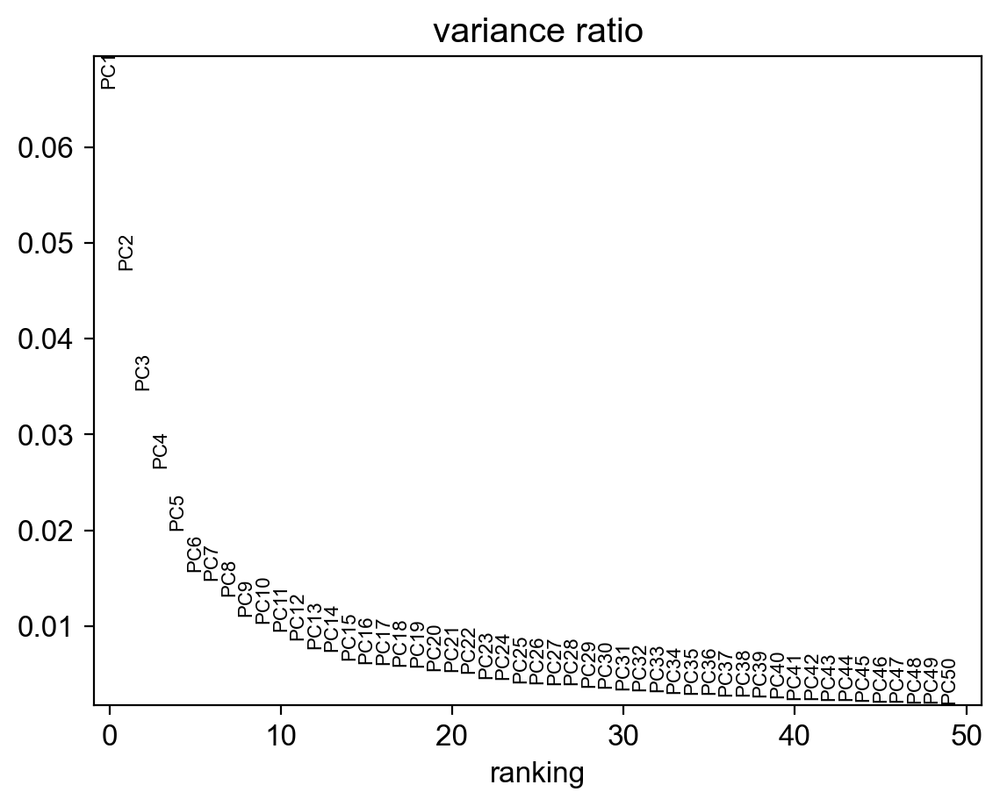

In [ ]:
sc.pl.pca_variance_ratio(ead_56.ad, 50)

In [ ]:
sc.pp.neighbors(ead_56.ad, n_pcs=30, n_neighbors=25)

In [ ]:
sc.tl.umap(ead_56.ad, 0.1)

In [ ]:
ead_56

enhancedAnndata: AnnData object with n_obs × n_vars = 13340 × 32833
    obs: 'CT', 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_organelle', 'log1p_total_counts_organelle', 'pct_counts_organelle', 'passFilter', 'temp'
    var: 'organelle', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank'
    uns: 'EnhancedAnndata_rawLayer', 'pseudobulk_anndata', 'sct_vst_pickle', 'sct_clip_range', 'pca', 'neighbors', 'umap'
    obsm: 'scDblFinder', 'sct_residual', 'X_pca', 'X_umap'
    layers: 'raw'
    obsp: 'distances', 'connectivities'
rawLayer: raw

In [ ]:
sc.tl.leiden(ead_56.ad, resolution=0.5)

2024-07-29 16:24:10.149 | DEBUG    | jpy_tools.singleCellTools.plotting:_embedding:1590 - ls_color: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14'],
      dtype='object')
2024-07-29 16:24:10.730 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888
2024-07-29 16:24:11.605 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888
2024-07-29 16:24:12.409 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888


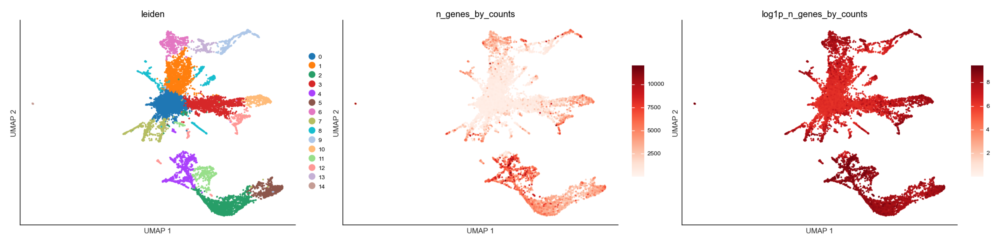

In [ ]:
ead_56.pl.embedding(
    color=["leiden", "n_genes_by_counts", "log1p_n_genes_by_counts"]
).show([20, 20])

In [ ]:
ead_56.cl.getClusterSpecGeneByCellex("leiden")

In [ ]:
ls_cutoff = [0.6, 0.7, 0.8, 0.9, 0.95, 0.99]
print(
    pd.concat(
        [
            ead_56.uns["leiden_cellexES"]
            .query(f"enrichScore > {x}")
            .value_counts("leiden")
            .rename(x)
            for x in ls_cutoff
        ],
        axis=1,
    ).rename_axis("cutoff", axis=1)
)

cutoff  0.60  0.70  0.80  0.90  0.95  0.99
leiden                                    
6       1578  1116   707   254    68     1
4       1443  1001   594   194    48     0
5       1361   956   584   235    85     3
10      1350   835   538   234    77     1
2       1274   940   614   235    61     0
11      1041   670   388   142    56     0
9        867   651   435   191    44     0
12       765   539   350   163    67     4
7        629   486   331   139    41     0
13       557   408   268   136    34     1
8        545   423   284   143    46     0
14       340   249   172    85    30     2
3        170   114    74    28    11     0
1        150   101    64    24     3     0
0         28     6     0     0     0     0


In [ ]:
dt_specGenes = (
    ead_56.uns["leiden_cellexES"]
    .query("enrichScore > 0.9")
    .groupby("leiden")
    .apply(lambda x: x.sort_values("enrichScore", ascending=False)["gene"].tolist())
    .to_dict()
)
dt_specGenes = {x: y for x, y in dt_specGenes.items() if len(y) > 0}

In [ ]:
ead_56.initLayer()

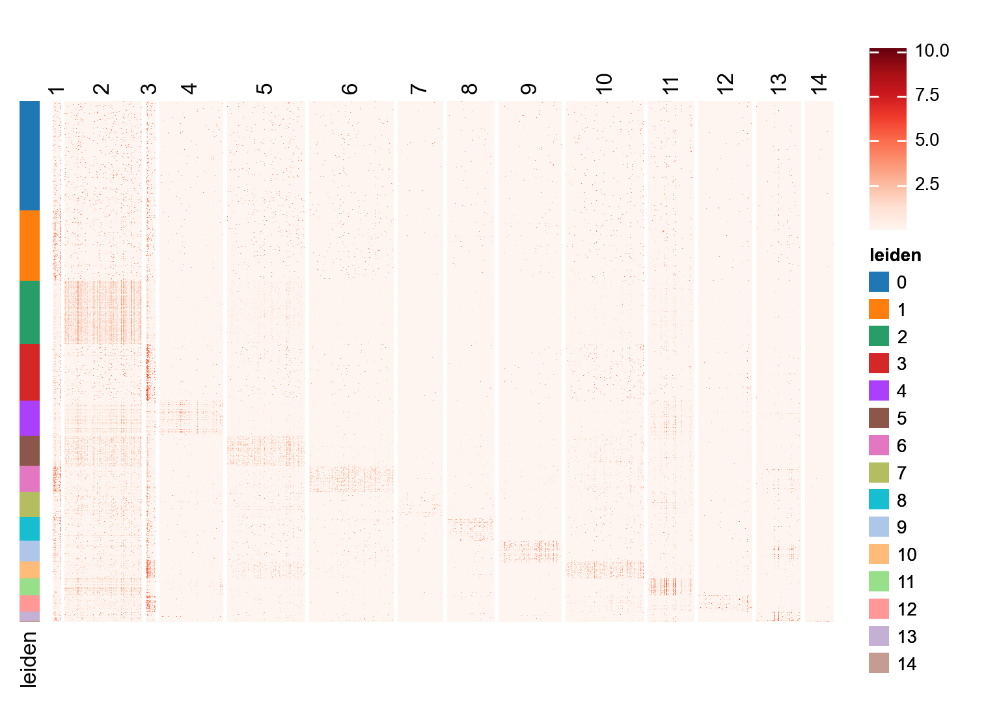

In [ ]:
ead_56.pl.heatmapGeneExp(
    None, ls_leftAnno=["leiden"], dt_genes=dt_specGenes, height=4, width=6
).render()

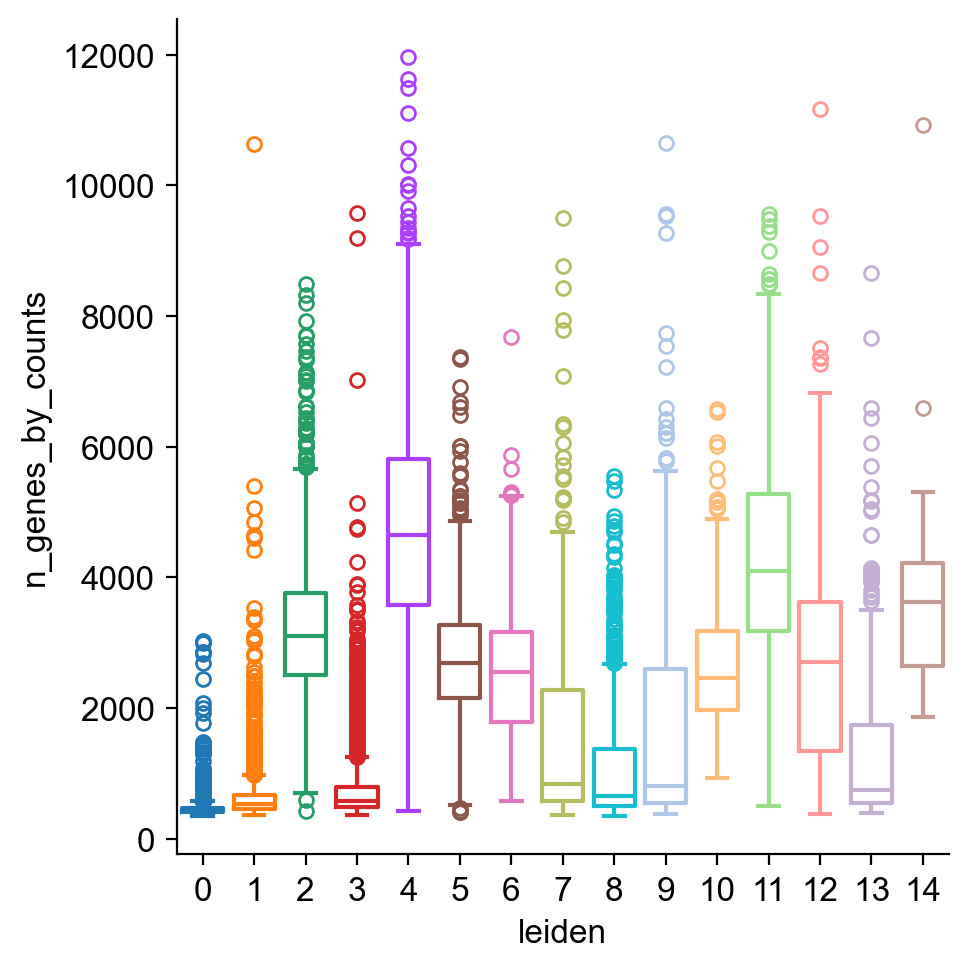

In [ ]:
ead_56.pl.catplot(x="leiden", y="n_genes_by_counts", kind="box", fill=False)

In [ ]:
ead_56.obs["genes>700"] = (ead_56.obs["n_genes_by_counts"] > 700).astype(str)
ead_56.obs["umis>1000"] = (ead_56.obs["total_counts"] > 1000).astype(str)

2024-07-29 16:36:14.628 | DEBUG    | jpy_tools.singleCellTools.plotting:_embedding:1590 - ls_color: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14'],
      dtype='object')
2024-07-29 16:36:15.217 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888
2024-07-29 16:36:16.062 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888
2024-07-29 16:36:16.847 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888
2024-07-29 16:36:17.020 | DEBUG    | jpy_tools.singleCellTools.plotting:_embedding:1590 - ls_color: Index(['False', 'True'], dtype='object')
2024-07-29 16:36:17.431 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8938888888888888
2024-07-29 16:36:17.602 | DEBUG    | jpy_tools.singleCellTools.plotting:_embedding:1590 - ls_color: Index(['False', 'True'], dtype='object')
2

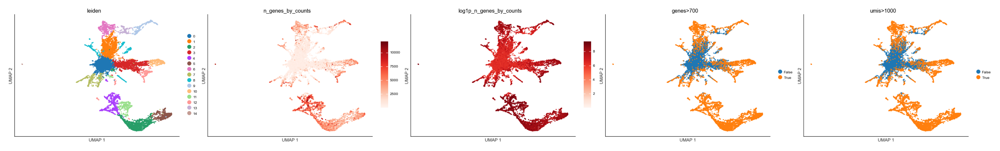

In [ ]:
ead_56.pl.embedding(
    color=[
        "leiden",
        "n_genes_by_counts",
        "log1p_n_genes_by_counts",
        "genes>700",
        "umis>1000",
    ],
    wrap=5,
).show([20, 20])

## Start QC

In [ ]:
geneMin, geneMax = 700, 6000

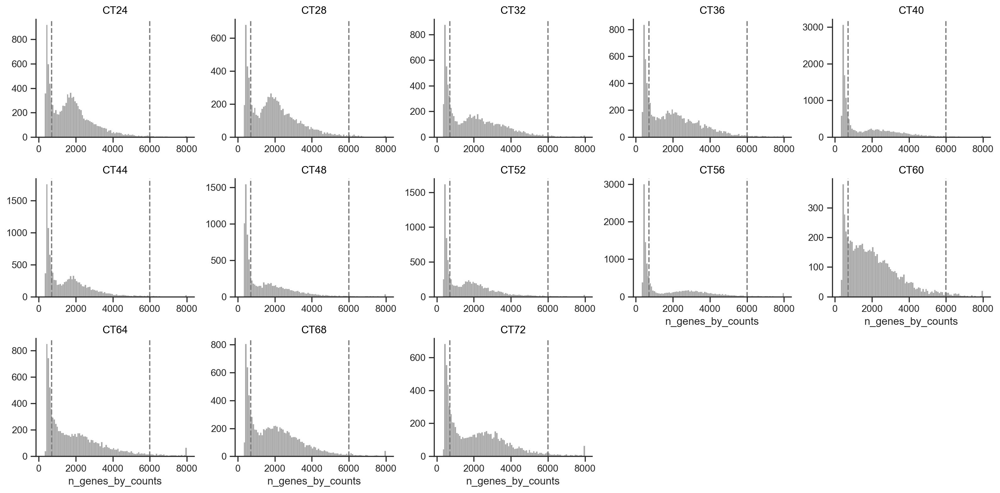

In [ ]:
ead.pl.histogram(
    "n_genes_by_counts",
    bins=100,
    groupby="CT",
    wrap=5,
    fc_additional=lambda _: _.layout(size=(16, 8)).share(y=False),
    binrange=(0, 8000),
    dt_kwargsToHist={"common_norm": False, "stat": "count"},
    markLine=(geneMin, geneMax),
)[1]

In [ ]:
ead.obs["temp"] = ead.obs.eval(
    "n_genes_by_counts < @geneMax & n_genes_by_counts > @geneMin"
)
ead.obs[["CT", "temp"]].value_counts().unstack().fillna(0).astype(int).T

CT,CT24,CT28,CT32,CT36,CT40,CT44,CT48,CT52,CT56,CT60,CT64,CT68,CT72
temp,,,,,,,,,,,,,
False,2626,1949,2469,2375,7213,4322,4330,3629,6515,1223,2732,2430,2210
True,7862,6714,5889,6433,8229,7573,5318,6027,6825,5707,6770,7512,6178


In [ ]:
umiMin, umiMax = 1000, 30000

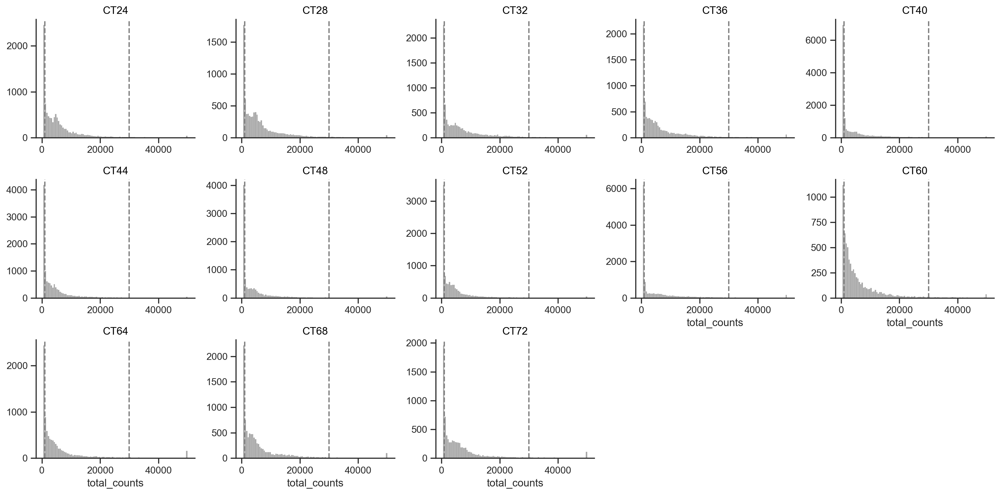

In [ ]:
ead.pl.histogram(
    "total_counts",
    bins=100,
    groupby="CT",
    wrap=5,
    fc_additional=lambda _: _.layout(size=(16, 8)).share(y=False),
    binrange=(0, 50000),
    dt_kwargsToHist={"common_norm": False, "stat": "count"},
    markLine=(umiMin, umiMax),
)[1]

In [ ]:
ead.obs["temp"] = ead.obs.eval("total_counts < @umiMax & total_counts > @umiMin")
ead.obs[["CT", "temp"]].value_counts().unstack().fillna(0).astype(int).T

CT,CT24,CT28,CT32,CT36,CT40,CT44,CT48,CT52,CT56,CT60,CT64,CT68,CT72
temp,,,,,,,,,,,,,
False,2655,1965,2490,2421,7311,4386,4212,3666,6679,1296,2833,2529,2317
True,7833,6698,5868,6387,8131,7509,5436,5990,6661,5634,6669,7413,6071


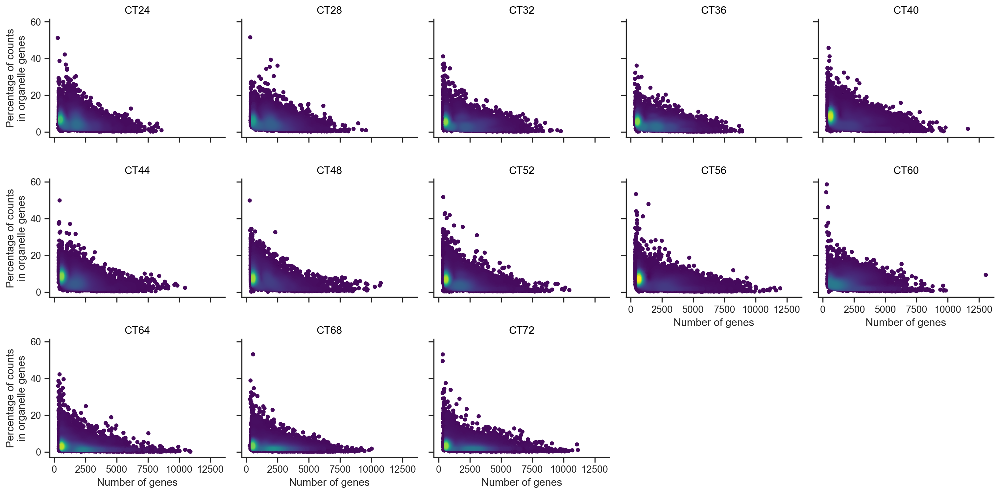

In [ ]:
(
    so.Plot(ead.obs, x="n_genes_by_counts", y="pct_counts_organelle")
    .facet(col="CT", wrap=5)
    .add(so.Dots(fillalpha=1), soExt.KdeDensityColor(), legend=False)
    .label(x="Number of genes", y="Percentage of counts\nin organelle genes")
    .layout(size=(16, 8))
    .scale(color="viridis")
)

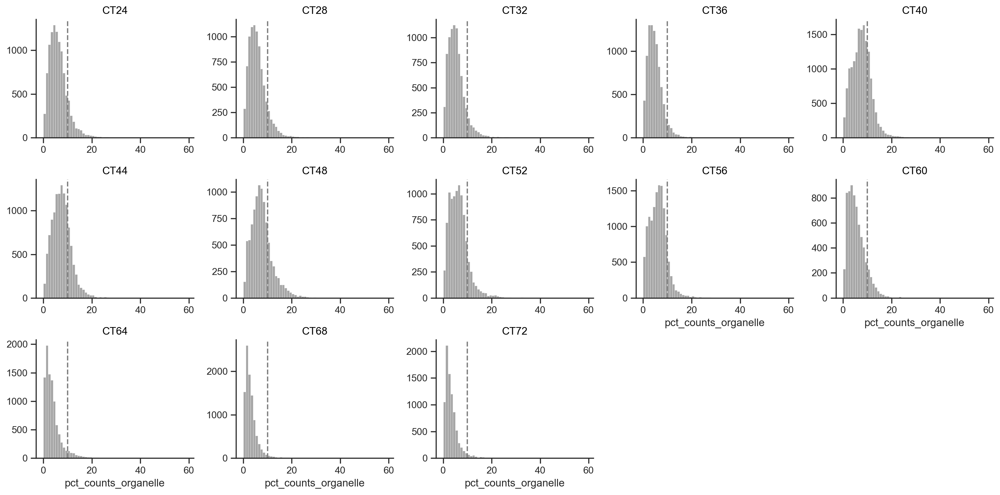

In [ ]:
ead.pl.histogram(
    "pct_counts_organelle",
    bins=100,
    groupby="CT",
    wrap=5,
    fc_additional=lambda _: _.layout(size=(16, 8)).share(y=False),
    binrange=(0, 100),
    dt_kwargsToHist={"common_norm": False, "stat": "count"},
    markLine=[10],
)[1]

In [ ]:
ead.obs["temp"] = ead.obs.eval("pct_counts_organelle < 10")
ead.obs[["CT", "temp"]].value_counts().unstack().fillna(0).astype(int).T

CT,CT24,CT28,CT32,CT36,CT40,CT44,CT48,CT52,CT56,CT60,CT64,CT68,CT72
temp,,,,,,,,,,,,,
False,1375,941,719,476,3808,2657,2196,1277,1501,782,638,296,346
True,9113,7722,7639,8332,11634,9238,7452,8379,11839,6148,8864,9646,8042


In [ ]:
ead.obs["passQc"] = ead.obs.eval(
    "n_genes_by_counts < @geneMax & n_genes_by_counts > @geneMin & total_counts < @umiMax & total_counts > @umiMin & pct_counts_organelle < 10"
)
ead.obs[["CT", "passQc"]].value_counts().unstack().fillna(0).astype(int).T

CT,CT24,CT28,CT32,CT36,CT40,CT44,CT48,CT52,CT56,CT60,CT64,CT68,CT72
passQc,,,,,,,,,,,,,
False,3713,2734,3016,2780,8550,5542,5433,4360,7158,1949,3278,2794,2611
True,6775,5929,5342,6028,6892,6353,4215,5296,6182,4981,6224,7148,5777


In [ ]:
ead_pass = ead[ead.obs["passQc"]].copy()

# SCT

In [ ]:
ead_pass.norm.normBySct("CT", nTopGenes=5000, njobs=7)

100%|██████████| 13/13 [00:02<00:00,  6.00it/s]



    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    
    an issue that caused a se

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_counts_organellepassFiltertemppassQcX__group; see ?make.names for more details on syntax validity

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_counts_organellepassFiltertemppassQcX__group; see ?make.names for more details on syntax validity

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_coun

  |                                                                      |   0%

R[write to console]: Total Step 1 genes: 21458

R[write to console]: Total overdispersed genes: 19720

R[write to console]: Excluding 1738 genes from Step 1 because they are not overdispersed.

R[write to console]: Variance stabilizing transformation of count matrix of size 21852 by 6775

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells



  |                                                                      |   0%

R[write to console]: Total Step 1 genes: 21761

R[write to console]: Total overdispersed genes: 20193

R[write to console]: Excluding 1568 genes from Step 1 because they are not overdispersed.

R[write to console]: Total Step 1 genes: 21580

R[write to console]: Total overdispersed genes: 20068

R[write to console]: Excluding 1512 genes from Step 1 because they are not overdispersed.

R[write to console]: Total Step 1 genes: 21882

R[write to console]: Total overdispersed genes: 20509

R[write to console]: Excluding 1373 genes from Step 1 because they are not overdispersed.

R[write to console]: Total Step 1 genes: 21654

R[write to console]: Total overdispersed genes: 20057

R[write to console]: Excluding 1597 genes from Step 1 because they are not overdispersed.

R[write to console]: Total Step 1 genes: 21863

R[write to console]: Total overdispersed genes: 20139

R[write to console]: Excluding 1724 genes from Step 1 because they are not overdispersed.

R[write to console]: Variance 

  |                                                                      |   0%

R[write to console]: Variance stabilizing transformation of count matrix of size 21860 by 6028

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells

R[write to console]: Variance stabilizing transformation of count matrix of size 21848 by 5929

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells

R[write to console]: Variance stabilizing transformation of count matrix of size 22313 by 6892

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells

R[write to console]: Variance stabilizing transformation of count matrix of size 22190 by 6353

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative 

  |======================================================================| 100%


R[write to console]: Setting estimate of  8 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 0

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 8

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1925

R[write to console]: Calling offset model for all 1925 poisson genes

R[write to console]: Found 23 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes



  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%


R[write to console]: Setting estimate of  39 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 368

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 52

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1718

R[write to console]: Calling offset model for all 1718 poisson genes

R[write to console]: Replacing fit params for 1925 poisson genes by theta=Inf

R[write to console]: Setting estimate of  28 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 167

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 28

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1739

R[write to console]: Calling offset model for all 1739 poisson genes

R[write t

  |                                                                      |   0%

R[write to console]: Replacing fit params for 1703 poisson genes by theta=Inf

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 21848 genes

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 21860 genes



  |======================================================================| 100%
  |                                                                            
  |                                                                      |   0%

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22313 genes

R[write to console]: Setting estimate of  61 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 392

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 65

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 2057

R[write to console]: Calling offset model for all 2057 poisson genes

R[write to console]: Setting estimate of  40 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 404

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 51

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 2002


  |======================================================================| 100%
  |======                                                                |   9%

R[write to console]: Setting estimate of  13 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 175

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 13

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1626

R[write to console]: Calling offset model for all 1626 poisson genes

R[write to console]: Found 26 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes

R[write to console]: Replacing fit params for 2057 poisson genes by theta=Inf



  |======                                                                |   9%

R[write to console]: Replacing fit params for 2002 poisson genes by theta=Inf



  |=====                                                                 |   7%

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22190 genes



  |======                                                                |   9%

R[write to console]: Replacing fit params for 1626 poisson genes by theta=Inf

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 21852 genes

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 21847 genes



  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%
  |========================================                              |  57%

R[write to console]: Calculating gene attributes



  |======================================================================| 100%
  |====================================================                  |  75%

R[write to console]: Calculating gene attributes



  |======================================================================| 100%
  |======================================================================| 100%
  |=========================================================             |  82%

R[write to console]: Wall clock passed: Time difference of 25.23039 secs

R[write to console]: Determine variable features



  |================================================================      |  91%

R[write to console]: Calculating gene attributes

R[write to console]: Calculating gene attributes

R[write to console]: Centering data matrix

  |                                                                            
  |                                                                      |   0%
  |                                                                            
  |==========                                                            |  14%
  |                                                                            
  |====================                                                  |  29%


  |===================================================================   |  95%

  |                                                                            
  |==============================                                        |  43%
R[write to console]: Wall clock passed: Time difference of 26.22698 secs

R[write to console]: Determine variable features



  |======================================================================| 100%


  |                                                                            
  |========================================                              |  57%
  |                                                                            
  |==================================================                    |  71%
  |                                                                            
  |============================================================          |  86%
  |                                                                            
  |======================================================================| 100%
R[write to console]: 

R[write to console]: Calculating gene attributes

R[write to console]: Calculating gene attributes

R[write to console]: Centering data matrix

  |                                                                            
  |                                                                      |   0%
R[write to console]: Wall clock p

  |                                                                      |   0%

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_counts_organellepassFiltertemppassQcX__group; see ?make.names for more details on syntax validity

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_counts_organellepassFiltertemppassQcX__group; see ?make.names for more details on syntax validity



  |==================                                                    |  25%

R[write to console]: vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

R[write to console]: Calculating cell attributes from input UMI matrix: log_umi

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_counts_organellepassFiltertemppassQcX__group; see ?make.names for more details on syntax validity

R[write to console]: Total Step 1 genes: 21956

R[write to console]: Total overdispersed genes: 20395

R[write to console]: Excluding 1561 genes from Step 1 because they are not overdispersed.

R[write to console]: vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

R[write to console]: Calculating cell attributes from input UMI matrix: log_umi

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, ma

  |                                                                      |   0%

R[write to console]: Warning:
R[write to console]:  Invalid name supplied, making object name syntactically valid. New object name is CTSourcen_genes_by_countslog1p_n_genes_by_countstotal_countslog1p_total_countstotal_counts_organellelog1p_total_counts_organellepct_counts_organellepassFiltertemppassQcX__group; see ?make.names for more details on syntax validity

R[write to console]: vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

R[write to console]: Calculating cell attributes from input UMI matrix: log_umi



  |===================================                                   |  50%

R[write to console]: Total Step 1 genes: 22241

R[write to console]: Total overdispersed genes: 20842

R[write to console]: Excluding 1399 genes from Step 1 because they are not overdispersed.

R[write to console]: Variance stabilizing transformation of count matrix of size 22527 by 6182

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells

R[write to console]: vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

R[write to console]: Calculating cell attributes from input UMI matrix: log_umi



  |                                                                      |   0%

R[write to console]: Total Step 1 genes: 22110

R[write to console]: Total overdispersed genes: 20776

R[write to console]: Excluding 1334 genes from Step 1 because they are not overdispersed.

R[write to console]: vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

R[write to console]: Calculating cell attributes from input UMI matrix: log_umi



  |                                                                      |   0%

R[write to console]: Variance stabilizing transformation of count matrix of size 22540 by 7148

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells

R[write to console]: Total Step 1 genes: 22282

R[write to console]: Total overdispersed genes: 20943

R[write to console]: Excluding 1339 genes from Step 1 because they are not overdispersed.

R[write to console]: Variance stabilizing transformation of count matrix of size 22563 by 6224

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells



  |====================================================                  |  75%

R[write to console]: Total Step 1 genes: 22402

R[write to console]: Total overdispersed genes: 21017

R[write to console]: Excluding 1385 genes from Step 1 because they are not overdispersed.

R[write to console]: Variance stabilizing transformation of count matrix of size 22588 by 5777

R[write to console]: Model formula is y ~ log_umi

R[write to console]: Get Negative Binomial regression parameters per gene

R[write to console]: Using 2000 genes, 5000 cells



  |======================================================================| 100%


R[write to console]: Setting estimate of  23 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 190

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 23

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1766

R[write to console]: Calling offset model for all 1766 poisson genes

R[write to console]: Found 35 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes



  |===================================                                   |  50%

R[write to console]: Replacing fit params for 1766 poisson genes by theta=Inf

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22137 genes



  |======================================================================| 100%
  |=================                                                     |  24%

R[write to console]: Setting estimate of  5 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 0

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 5

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1561

R[write to console]: Calling offset model for all 1561 poisson genes

R[write to console]: Found 16 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes



  |=======================                                               |  33%

R[write to console]: Replacing fit params for 1561 poisson genes by theta=Inf

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 21956 genes



  |======================================================================| 100%
  |======================================================================| 100%
  |==================================                                    |  49%

R[write to console]: Setting estimate of  39 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 513

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 55

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1697

R[write to console]: Calling offset model for all 1697 poisson genes

R[write to console]: Setting estimate of  30 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 383

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 45

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1634

R[write to console]: Calling offset model for all 1634 poisson genes

R[write to console]: Found 44 outliers - those will be ignored in fitting/regularization

  |======================================================================| 100%


R[write to console]: Setting estimate of  32 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 363

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 46

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1561

R[write to console]: Calling offset model for all 1561 poisson genes

R[write to console]: Found 42 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes

R[write to console]: Replacing fit params for 1697 poisson genes by theta=Inf



  |===============================================                       |  67%

R[write to console]: Replacing fit params for 1634 poisson genes by theta=Inf



  |                                                                      |   0%

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22540 genes

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22527 genes

R[write to console]: Replacing fit params for 1561 poisson genes by theta=Inf



  |=========================                                             |  36%

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22563 genes



  |======================================================================| 100%
  |==============================================================        |  89%

R[write to console]: Setting estimate of  19 genes to inf as theta_mm/theta_mle < 1e-3

R[write to console]: # of step1 poisson genes (variance < mean): 0

R[write to console]: # of low mean genes (mean < 0.001): 175

R[write to console]: Total # of Step1 poisson genes (theta=Inf; variance < mean): 19

R[write to console]: Total # of poisson genes (theta=Inf; variance < mean): 1510

R[write to console]: Calling offset model for all 1510 poisson genes

R[write to console]: Found 30 outliers - those will be ignored in fitting/regularization step


R[write to console]: Ignoring theta inf genes



  |======================================================================| 100%
  |======                                                                |   9%

R[write to console]: Replacing fit params for 1510 poisson genes by theta=Inf



  |=========                                                             |  13%

R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Second step: Get residuals using fitted parameters for 22588 genes



  |==============                                                        |  20%

R[write to console]: Calculating gene attributes



  |======================================================================| 100%
  |===================================                                   |  50%

R[write to console]: Wall clock passed: Time difference of 22.49018 secs

R[write to console]: Determine variable features



  |==========================                                            |  37%

R[write to console]: Calculating gene attributes

R[write to console]: Centering data matrix

  |                                                                            
  |                                                                      |   0%
  |                                                                            
  |==========                                                            |  14%


  |=========================================                             |  59%

  |                                                                            
  |====================                                                  |  29%
  |                                                                            
  |==============================                                        |  43%
  |                                                                            
  |========================================                              |  57%


  |=================================================                     |  70%

  |                                                                            
  |==================================================                    |  71%
  |                                                                            
  |============================================================          |  86%
  |                                                                            
  |======================================================================| 100%
R[write to console]: 

R[write to console]: Wall clock passed: Time difference of 20.6431 secs

R[write to console]: Determine variable features



  |=====================================================                 |  76%

R[write to console]: Set default assay to SCT



  |                                                                            

R[write to console]: Centering data matrix

  |                                                                            
  |                                                                      |   0%
  |                                                                            
  |==========                                                            |  14%
  |                                                                            
  |====================                                                  |  29%
  |                                                                            
  |==============================                                        |  43%


  |=======================================================               |  78%

  |                                                                            
  |========================================                              |  57%
  |                                                                            
  |==================================================                    |  71%
  |                                                                            
  |============================================================          |  86%
  |                                                                            
  |======================================================================| 100%
R[write to console]: 



  |===========================================================           |  85%

R[write to console]: Set default assay to SCT



  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%


R[write to console]: Calculating gene attributes

R[write to console]: Calculating gene attributes

R[write to console]: Calculating gene attributes

R[write to console]: Wall clock passed: Time difference of 25.35742 secs

R[write to console]: Determine variable features

R[write to console]: Calculating gene attributes

R[write to console]: Wall clock passed: Time difference of 25.02261 secs

R[write to console]: Determine variable features

R[write to console]: Centering data matrix

  |                                                                            
  |                                                                      |   0%
  |                                                                            
  |==========                                                            |  14%
  |                                                                            
  |====================                                                  |  29%
  |                         

  |======================================================================| 100%


  8%|▊         | 1/13 [00:08<01:47,  8.98s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 15%|█▌        | 2/13 [00:17<01:35,  8.66s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 23%|██▎       | 3/13 [00:24<01:18,  7.90s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 31%|███       | 4/13 [00:32<01:12,  8.09s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 38%|███▊      | 5/13 [00:42<01:08,  8.56s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 46%|████▌     | 6/13 [00:49<00:57,  8.25s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 54%|█████▍    | 7/13 [00:55<00:44,  7.36s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 62%|██████▏   | 8/13 [01:03<00:38,  7.70s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 69%|██████▉   | 9/13 [01:12<00:32,  8.12s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 77%|███████▋  | 10/13 [01:19<00:23,  7.76s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 85%|████████▍ | 11/13 [01:28<00:16,  8.13s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


 92%|█████████▏| 12/13 [01:38<00:08,  8.51s/it]R[write to console]: Setting min_variance based on median UMI:  0.04

R[write to console]: Calculating residuals of type pearson for 5000 genes



  |======================================================================| 100%


100%|██████████| 13/13 [01:46<00:00,  8.22s/it]


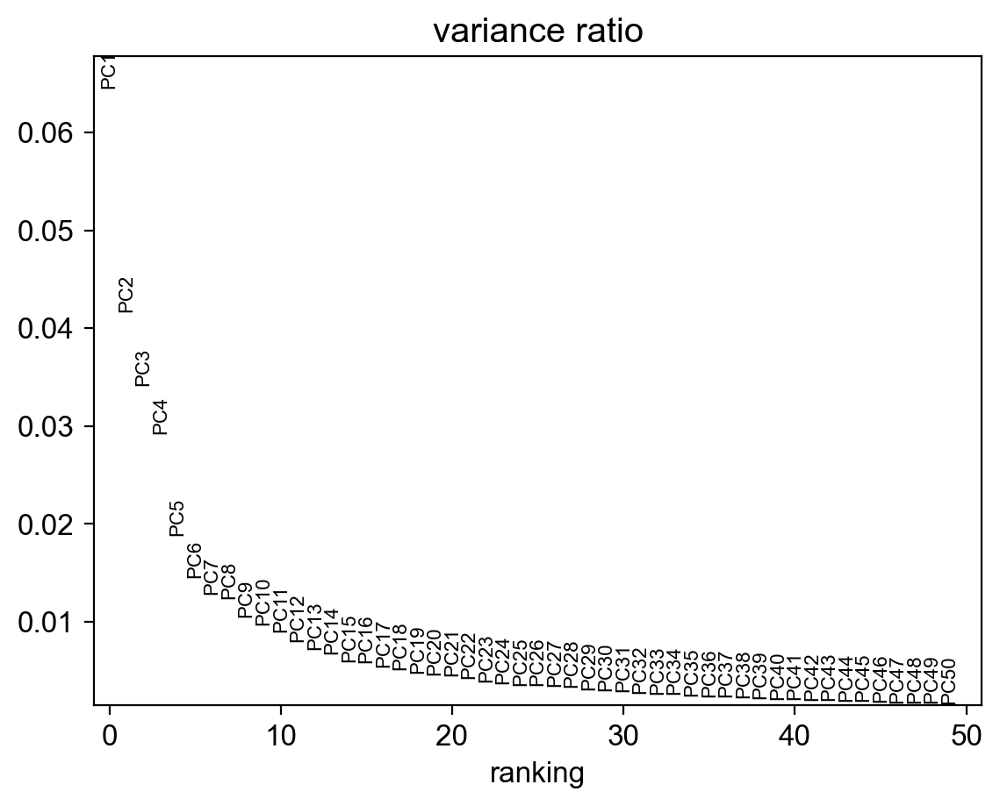

In [ ]:
sc.pl.pca_variance_ratio(ead_pass.ad, 50)

In [ ]:
sc.pp.neighbors(ead_pass.ad, n_pcs=30)
sc.tl.umap(ead_pass.ad, 0.1)

2024-07-29 16:58:25.080 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1717 - Title location: 0.8995833333333333


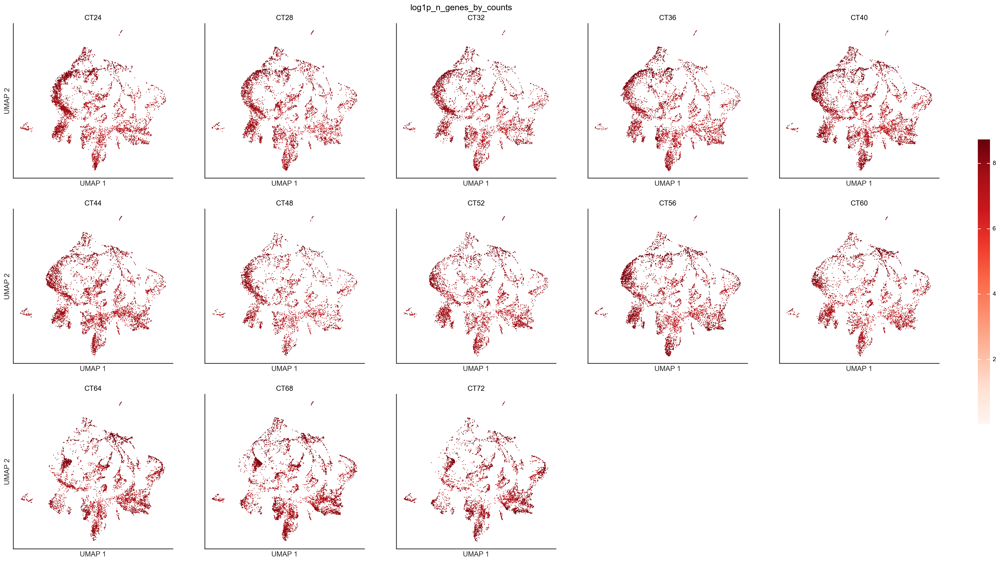

In [ ]:
ead_pass.pl.embedding(
    groupby="CT", wrap=5, color="log1p_n_genes_by_counts", figsize=(28, 16), size=0.5
)

In [ ]:
ead_pass.obsm["X_umap_sct"] = ead_pass.obsm["X_umap"].copy()

# Harmony

In [ ]:
import scanpy.external as sce

In [ ]:
ead_pass.ad.obsm["X_pca_30"] = ead_pass.ad.obsm["X_pca"][:, :30]

In [ ]:
sce.pp.harmony_integrate(ead_pass.ad, key="CT", basis="X_pca_30", block_size=0.01)

2024-07-29 17:50:31,881 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-07-29 17:50:31 - INFO - Computing initial centroids with sklearn.KMeans...
2024-07-29 17:50:31 - INFO - Computing initial centroids with sklearn.KMeans...
2024-07-29 17:50:37,081 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-07-29 17:50:37 - INFO - sklearn.KMeans initialization complete.
2024-07-29 17:50:37,461 - harmonypy - INFO - Iteration 1 of 10
2024-07-29 17:50:37 - INFO - Iteration 1 of 10
2024-07-29 17:50:56,376 - harmonypy - INFO - Iteration 2 of 10
2024-07-29 17:50:56 - INFO - Iteration 2 of 10
2024-07-29 17:51:13,104 - harmonypy - INFO - Iteration 3 of 10
2024-07-29 17:51:13 - INFO - Iteration 3 of 10
2024-07-29 17:51:29,546 - harmonypy - INFO - Iteration 4 of 10
2024-07-29 17:51:29 - INFO - Iteration 4 of 10
2024-07-29 17:51:46,748 - harmonypy - INFO - Iteration 5 of 10
2024-07-29 17:51:46 - INFO - Iteration 5 of 10
2024-07-29 17:52:04,732 - harmonypy - IN

In [ ]:
sc.pp.neighbors(ead_pass.ad, use_rep="X_pca_harmony", metric="cosine", n_neighbors=25)

In [ ]:
sc.tl.umap(ead_pass.ad, 0.3)

2024-07-29 17:54:17.639 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1718 - Title location: 0.8995833333333333


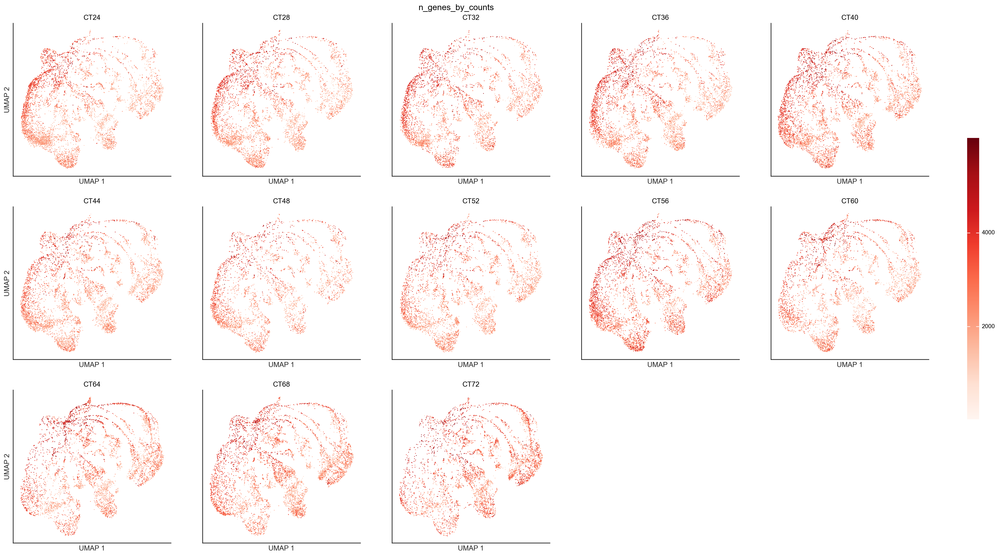

In [ ]:
ead_pass.pl.embedding(
    groupby="CT", wrap=5, color="n_genes_by_counts", figsize=(28, 16), size=0.5
)

In [ ]:
ls_res = [round(x, 2) for x in np.arange(0.1, 1.52, 0.02)]

In [ ]:
del ead_pass.obsm["leiden"]

2024-07-29 17:58:00.979 | INFO     | jpy_tools.singleCellTools.others:clusteringAndCalculateShilouetteScore:1110 - clustering using leiden algorithm
2024-07-29 17:58:00.984 | INFO     | jpy_tools.singleCellTools.others:clusteringAndCalculateShilouetteScore:1112 - used res: [0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38, 0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56, 0.58, 0.6, 0.62, 0.64, 0.66, 0.68, 0.7, 0.72, 0.74, 0.76, 0.78, 0.8, 0.82, 0.84, 0.86, 0.88, 0.9, 0.92, 0.94, 0.96, 0.98, 1.0, 1.02, 1.04, 1.06, 1.08, 1.1, 1.12, 1.14, 1.16, 1.18, 1.2, 1.22, 1.24, 1.26, 1.28, 1.3, 1.32, 1.34, 1.36, 1.38, 1.4, 1.42, 1.44, 1.46, 1.48, 1.5]
res:  28%|██▊       | 20/71 [00:02<00:06,  7.43it/s]/datapool/home/zhijian/zhijian/miniconda3/envs/soybean_sam/lib/python3.9/site-packages/jpy_tools/singleCellTools/others.py:1124: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults pl

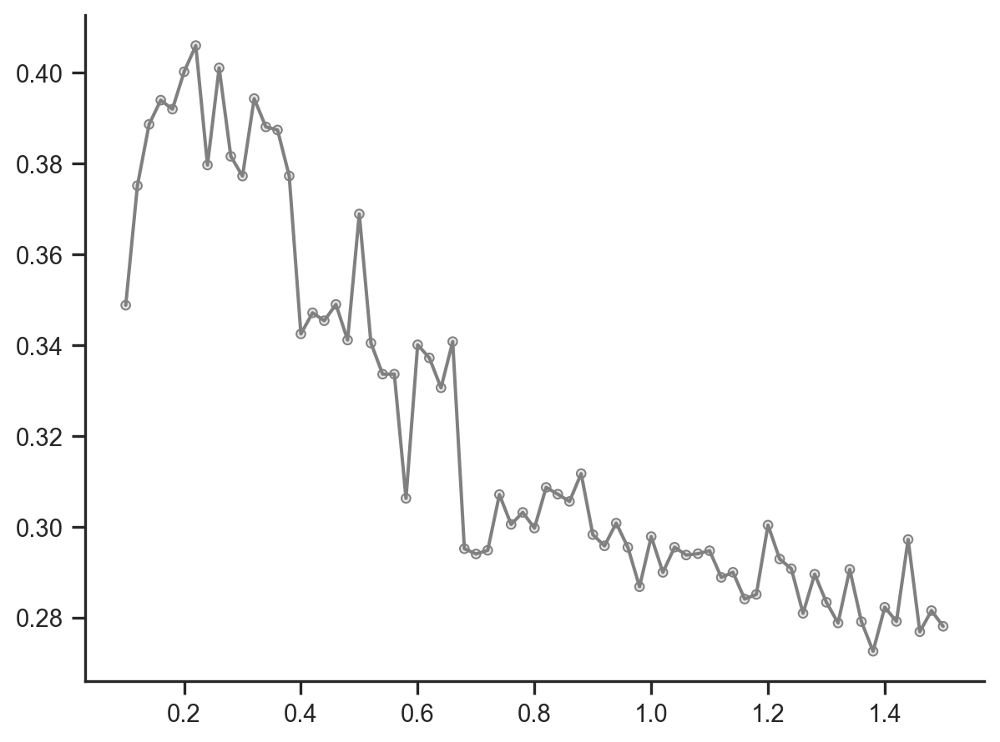

{0.1: 0.34879587615489194,
 0.12: 0.37513579652927465,
 0.14: 0.38865013888555316,
 0.16: 0.3939872423211076,
 0.18: 0.3920071118616666,
 0.2: 0.40024141180787626,
 0.22: 0.40601796388197076,
 0.24: 0.3796890086571187,
 0.26: 0.4010958904957492,
 0.28: 0.3816054724829089,
 0.3: 0.377253270229765,
 0.32: 0.3943238619894389,
 0.34: 0.3880861390709981,
 0.36: 0.3874158260035236,
 0.38: 0.37728361534205335,
 0.4: 0.3424771936257991,
 0.42: 0.3471264743649396,
 0.44: 0.3453808832131308,
 0.46: 0.34896887548309824,
 0.48: 0.3411198351527326,
 0.5: 0.3689022681517094,
 0.52: 0.3404531307118783,
 0.54: 0.33360044535310923,
 0.56: 0.33360814380992004,
 0.58: 0.3062301514769364,
 0.6: 0.34006878426572856,
 0.62: 0.3371827170825378,
 0.64: 0.3306009550483442,
 0.66: 0.34077517722289546,
 0.68: 0.29513124753581826,
 0.7: 0.29397541864519744,
 0.72: 0.2947850312461393,
 0.74: 0.3070628146971779,
 0.76: 0.30048850437869923,
 0.78: 0.3031387608383264,
 0.8: 0.29967542563277355,
 0.82: 0.3086533127052

In [ ]:
ead_pass.cl.getShilouetteScore(
    ls_res, "X_pca_harmony", subsample=20000, n_iterations=2, cores=20, metric="cosine"
)

2024-07-29 18:03:15.636 | DEBUG    | jpy_tools.singleCellTools.plotting:_embedding:1591 - ls_color: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31'],
      dtype='object')
2024-07-29 18:03:17.144 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1718 - Title location: 0.8938888888888888


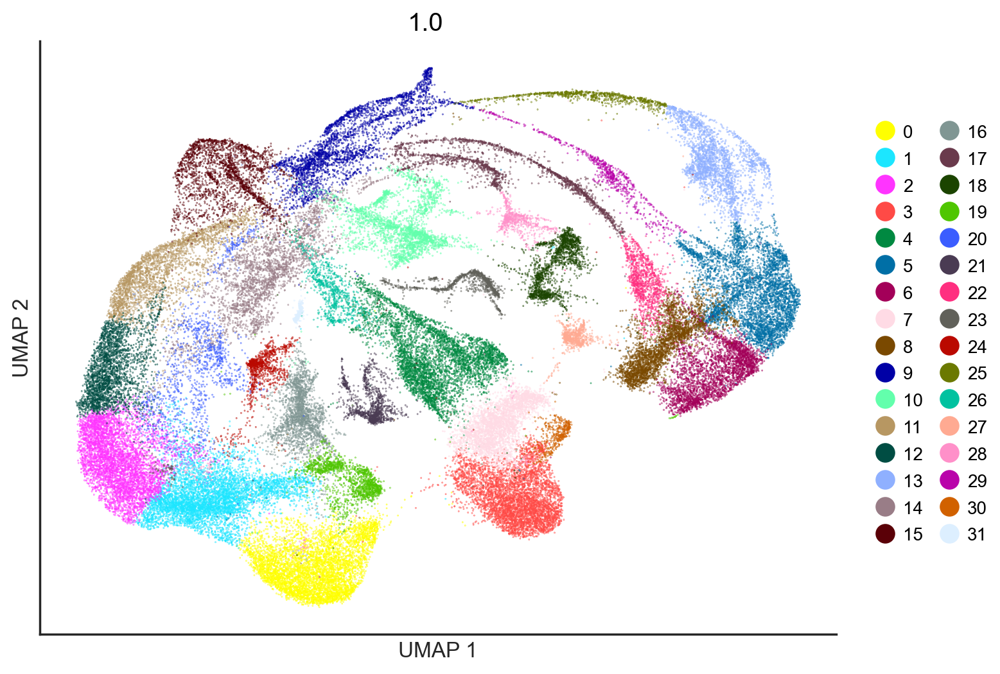

In [ ]:
ead_pass.pl.embedding(color="1.0", size=0.2, legendCol=2, colorUseObsm="leiden")

In [ ]:
del ead_pass.obsm["sct_residual"]

2024-07-29 18:04:36.980 | DEBUG    | jpy_tools.singleCellTools.plotting:_embedding:1591 - ls_color: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31'],
      dtype='object')
2024-07-29 18:04:38.538 | INFO     | jpy_tools.singleCellTools.plotting:_embedding:1718 - Title location: 0.8938888888888888


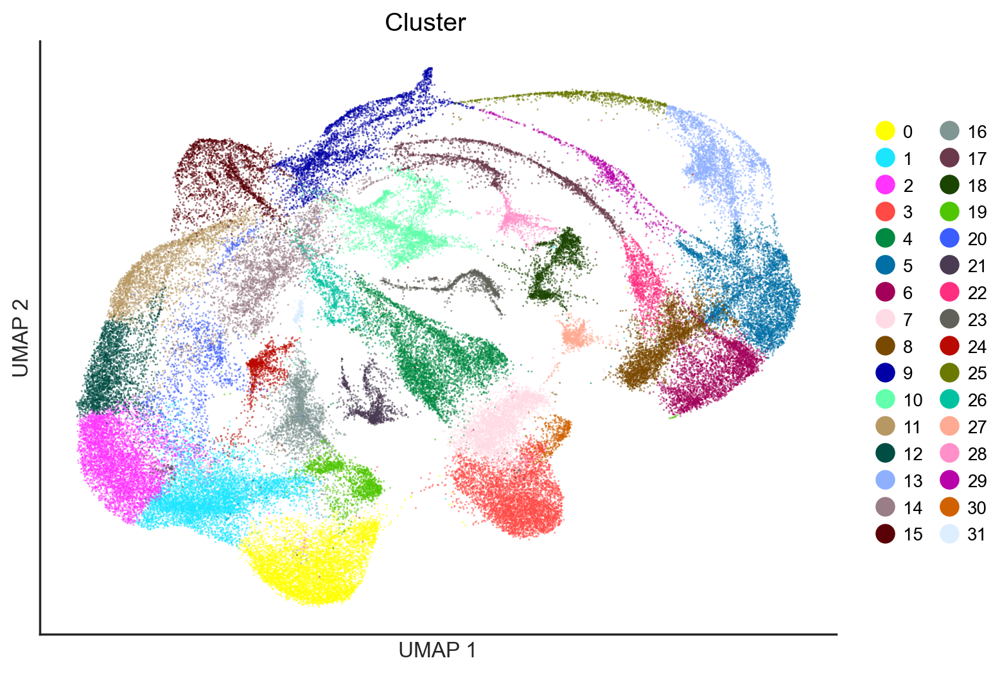

In [ ]:
ead_pass.obs["Cluster"] = ead_pass.obsm["leiden"]["1.0"]
ead_pass.pl.embedding(color="Cluster", size=0.2, legendCol=2)

In [ ]:
ead_pass.ad._sanitize()

In [ ]:
ead_pass.obs["CT_int"] = ead_pass.obs["CT"].str[2:].astype(int)
ead_pass.obs["CT_raw"] = ead_pass.obs["CT"].copy()
ead_pass.obs["CT"] = ead_pass.obs["CT_int"].copy()

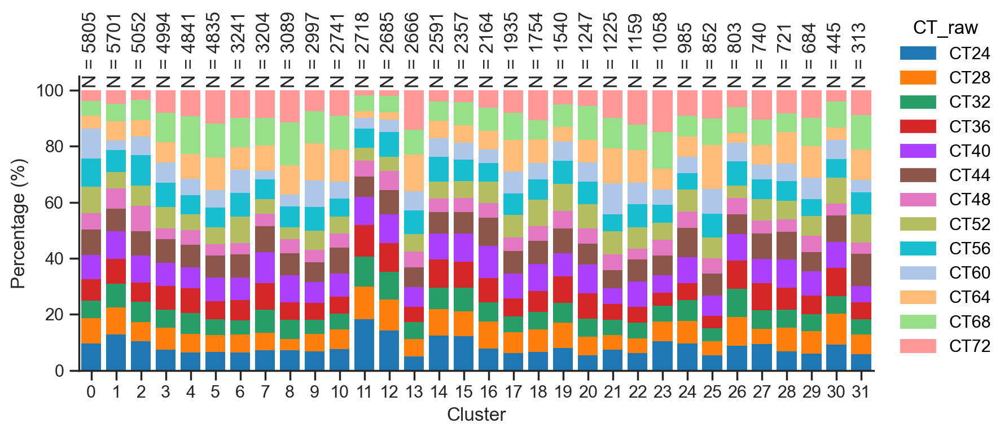

In [ ]:
ead_pass.pl.clusterPercentage("Cluster", "CT_raw", figsize=(8, 4))[1]

In [ ]:
toPkl(ead_pass.ad, "afterCluster_0729", "gpu", dir_path=dir_result)

2024-07-29 18:05:40.552 | INFO     | jpy_tools.otherTools:toPkl:482 - please run `loadPkl('afterCluster_0729', lambda **dt:sc.read_h5ad(**dt), arg_path='filename')` to get object


In [ ]:
ead = singleCellTools.EnhancedAnndata(
    loadPkl(
        "afterCluster_0729",
        lambda **dt: sc.read_h5ad(**dt),
        arg_path="filename",
        dir_path=dir_result,
    )
)

2024-07-29 18:23:45.646 | WARNING  | jpy_tools.singleCellTools:rawLayer:463 - rawLayer will be overwritten by raw and all the related objects will be re-initialized


In [ ]:
ead

enhancedAnndata: AnnData object with n_obs × n_vars = 77142 × 32833
    obs: 'CT', 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_organelle', 'log1p_total_counts_organelle', 'pct_counts_organelle', 'passFilter', 'temp', 'passQc', '__group', 'Cluster', 'CT_int', 'CT_raw'
    var: 'organelle', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable'
    uns: 'CT_raw_colors', 'Cluster_colors', 'EnhancedAnndata_rawLayer', 'metacycle_normalizeLog_0729', 'neighbors', 'pca', 'pseudobulk_anndata', 'sctModels', 'umap', 'Cluster_cellexES', 'log1p'
    obsm: 'X_pca', 'X_pca_30', 'X_pca_harmony', 'X_umap', 'X_umap_sct', 'leiden', 'scDblFinder'
    varm: 'Cluster_cellexES'
    layers: 'raw', 'normalize_log'
    obsp: 'connectivities', 'distances'
rawLayer: raw

In [ ]:
sc.tl.dendrogram(ead.ad, 'Cluster', use_rep='X_pca_harmony', optimal_ordering=True)

In [ ]:
ead.pl.embedding(
    groupby="CT_raw",
    wrap=5,
    color="Cluster",
    figsize=(28, 16),
    size=1,
    addBackground=True,
)